In [1]:
%pip install torch --index-url https://download.pytorch.org/whl/cu121
# %pip install --force-reinstall --user torch ultralytics==8.0.196


Looking in indexes: https://download.pytorch.org/whl/cu121
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
%pip install --user roboflow python-dotenv opencv-python-headless matplotlib ultralytics==8.0.196

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [10]:
import os
from dotenv import load_dotenv
from roboflow import Roboflow

load_dotenv()

roboflow_api_key = os.getenv("ROBOFLOW_API_KEY")
rf = Roboflow(api_key=roboflow_api_key)

project = rf.workspace("detectionanas").project("pepsi-logo-detection")
version = project.version(1)

dataset = version.download("yolov8")

print("Dataset downloaded successfully.")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Pepsi-Logo-Detection-1 in yolov8:: 100%|██████████| 3127/3127 [00:00<00:00, 4613.61it/s]

Dataset downloaded successfully.


Image path: d:\VideoVerseAssignment\pepsi_test\Pepsi-Logo-Detection-1\train/images
Label path: d:\VideoVerseAssignment\pepsi_test\Pepsi-Logo-Detection-1\train/labels
Found 1241 image files.
['img000015_87_jpg.rf.730eb617e70f96c17f923a57cbae2c7b.jpg', 'img000021_87_jpg.rf.6f6202e8a5d0895277902d37b6551ec9.jpg', 'img000023_87_jpg.rf.966c505692c36491d6993e4113edbe6d.jpg', 'img000037_87_jpg.rf.76837919be00c3bdecdef03dceccdf02.jpg', 'img000043_87_jpg.rf.7f9d53391e4e324a0969d53704392302.jpg', 'img000051_87_jpg.rf.3550b68dab4e7d565775dec462c5dee6.jpg', 'img000052_87_jpg.rf.5de128955a1c41f90424349cd262493f.jpg', 'img000061_87_jpg.rf.76e487f6cf65de1df4e8db2d153b7eb1.jpg', 'img000063_87_jpg.rf.4937855f946e8d5aff15f582ca75ca1f.jpg', 'img000076_87_jpg.rf.33984f36149d28136e50894e32c24d4f.jpg']
Loaded image img000015_87_jpg.rf.730eb617e70f96c17f923a57cbae2c7b.jpg with shape: (1280, 1280, 3)


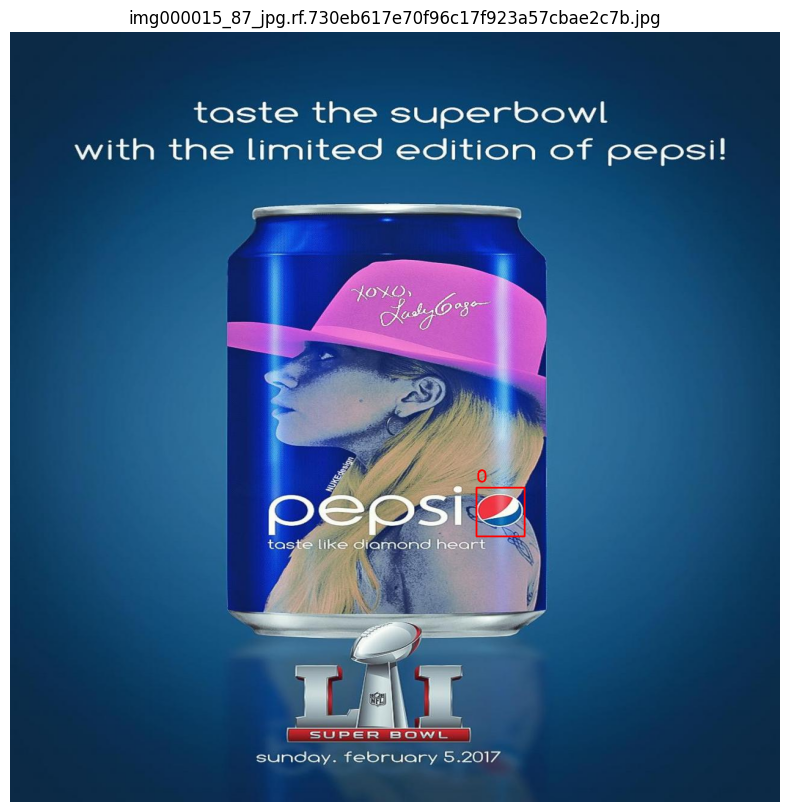

Loaded image img000021_87_jpg.rf.6f6202e8a5d0895277902d37b6551ec9.jpg with shape: (1280, 1280, 3)


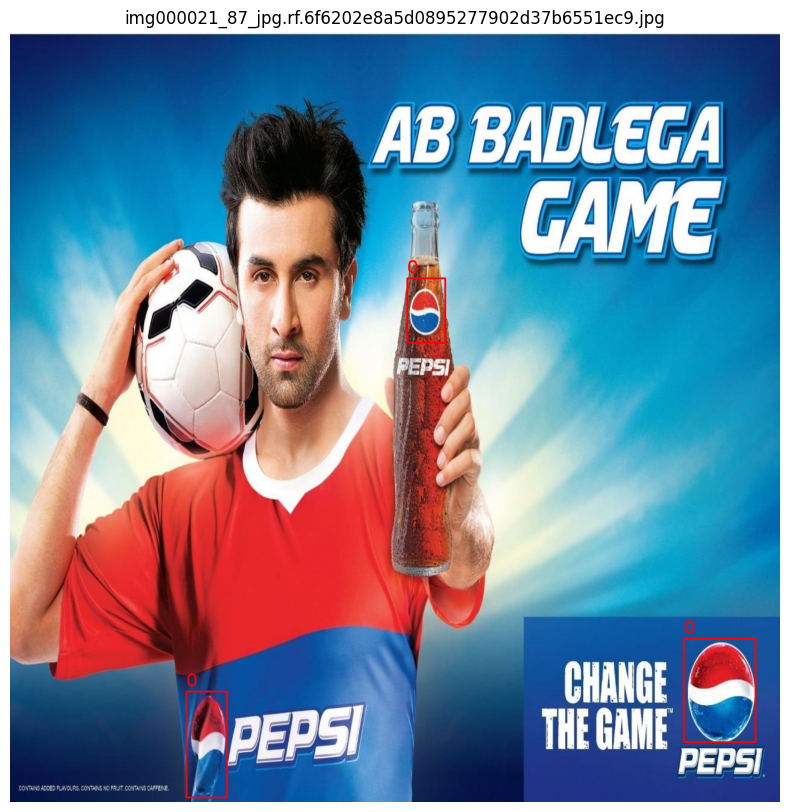

Loaded image img000023_87_jpg.rf.966c505692c36491d6993e4113edbe6d.jpg with shape: (1280, 1280, 3)


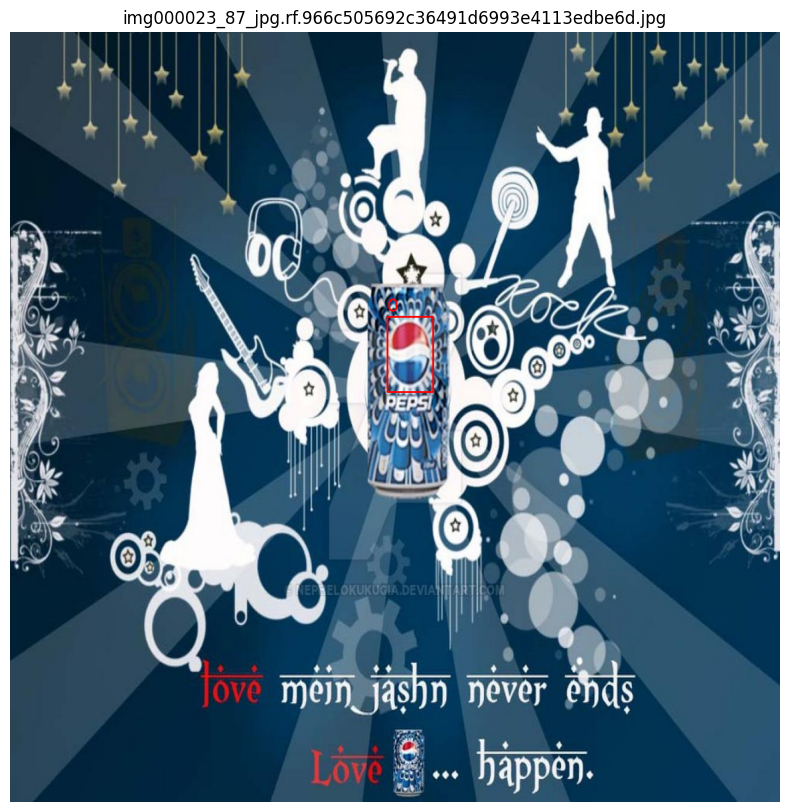

Loaded image img000037_87_jpg.rf.76837919be00c3bdecdef03dceccdf02.jpg with shape: (1280, 1280, 3)


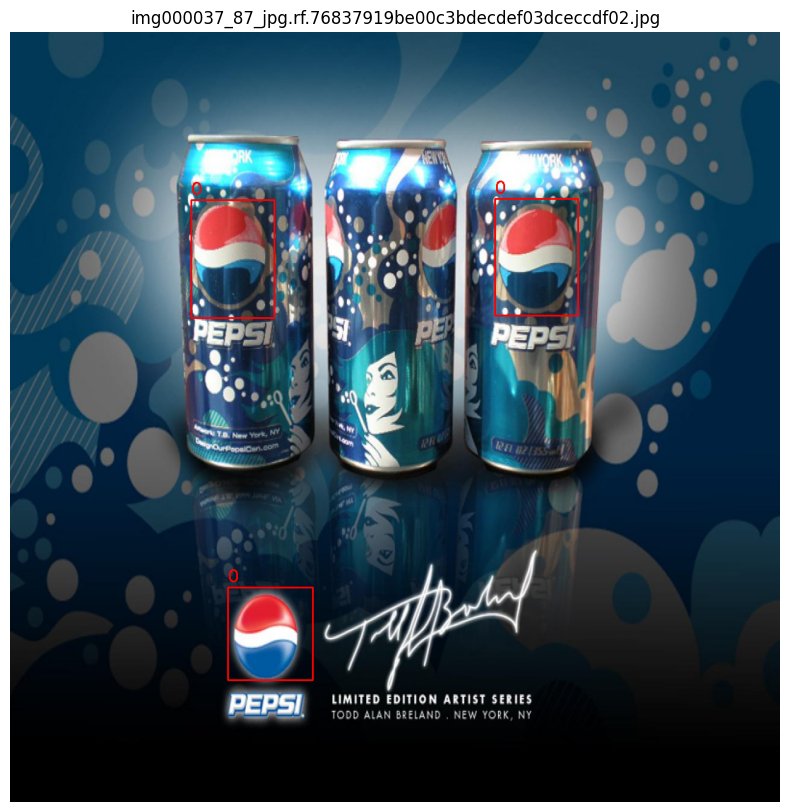

Loaded image img000043_87_jpg.rf.7f9d53391e4e324a0969d53704392302.jpg with shape: (1280, 1280, 3)


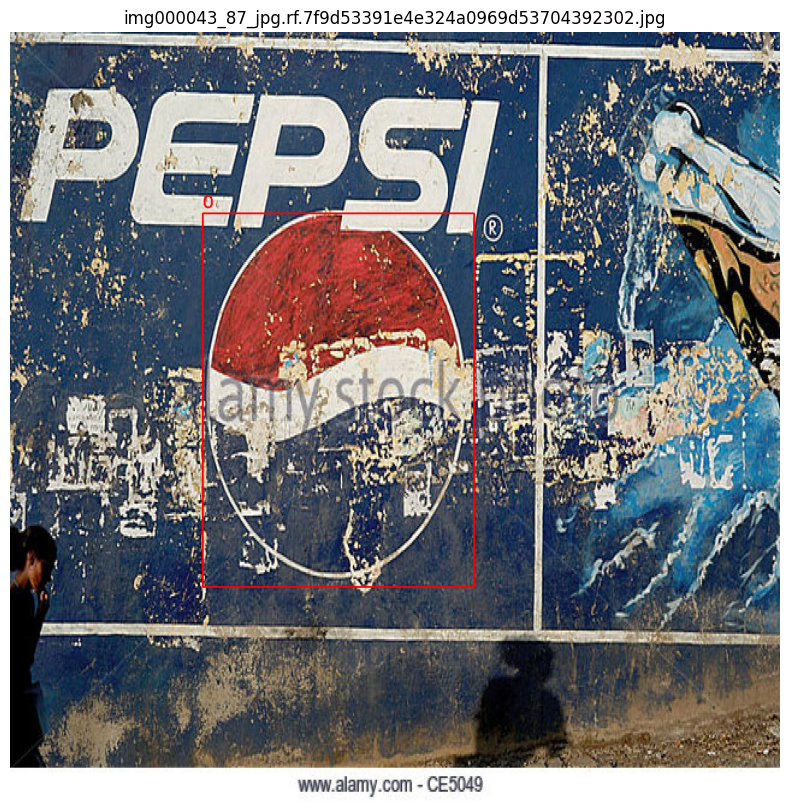

Loaded image img000051_87_jpg.rf.3550b68dab4e7d565775dec462c5dee6.jpg with shape: (1280, 1280, 3)


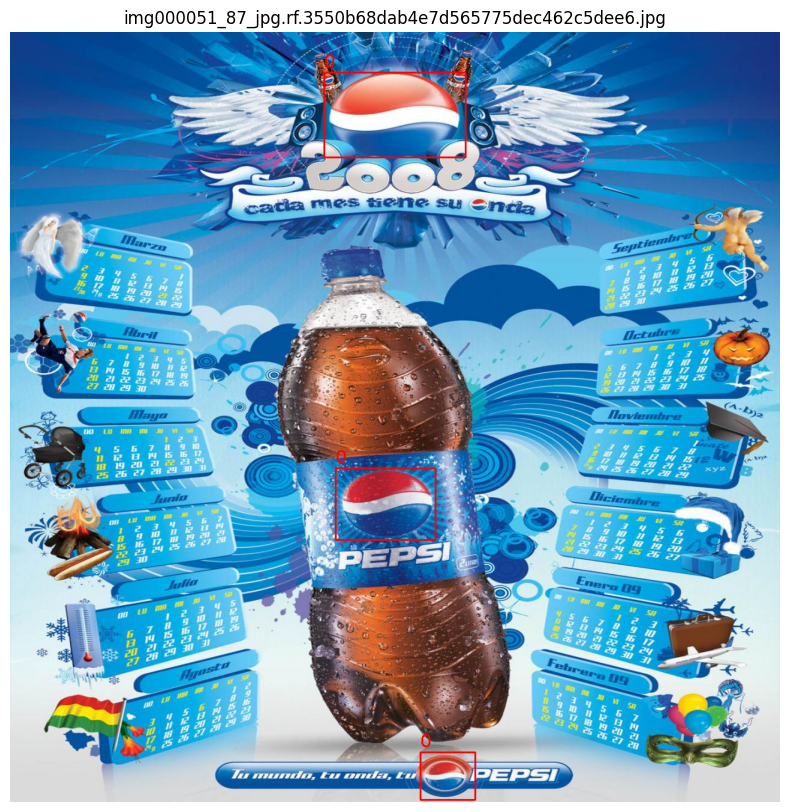

Loaded image img000052_87_jpg.rf.5de128955a1c41f90424349cd262493f.jpg with shape: (1280, 1280, 3)


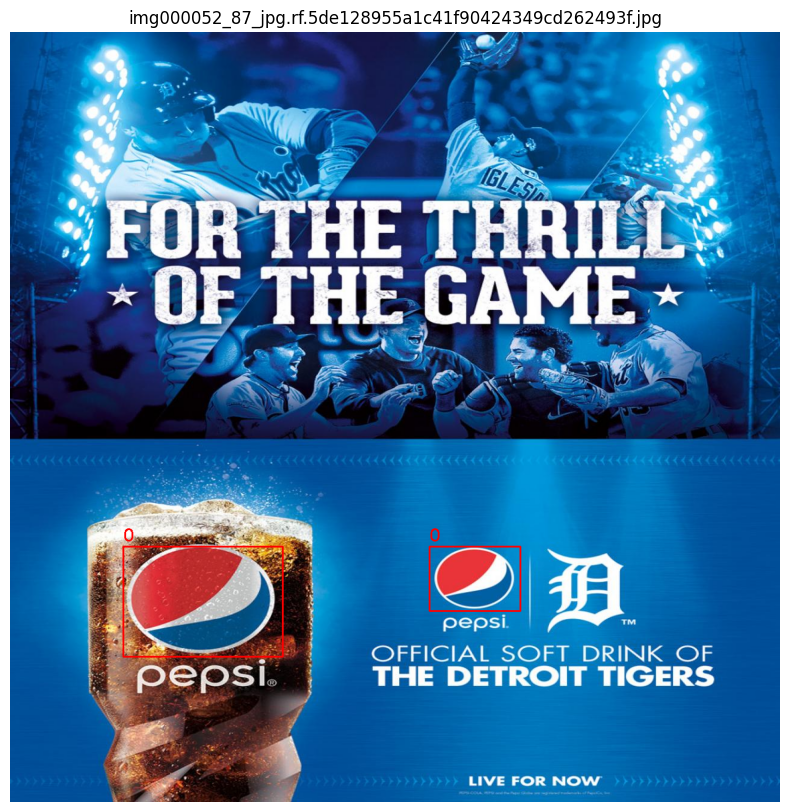

Loaded image img000061_87_jpg.rf.76e487f6cf65de1df4e8db2d153b7eb1.jpg with shape: (1280, 1280, 3)


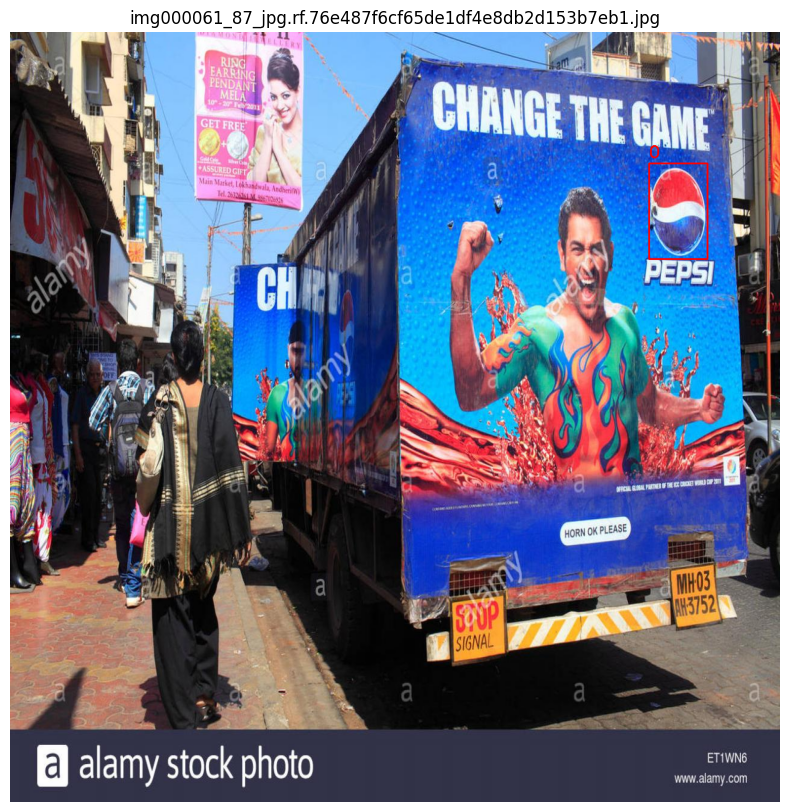

Loaded image img000063_87_jpg.rf.4937855f946e8d5aff15f582ca75ca1f.jpg with shape: (1280, 1280, 3)


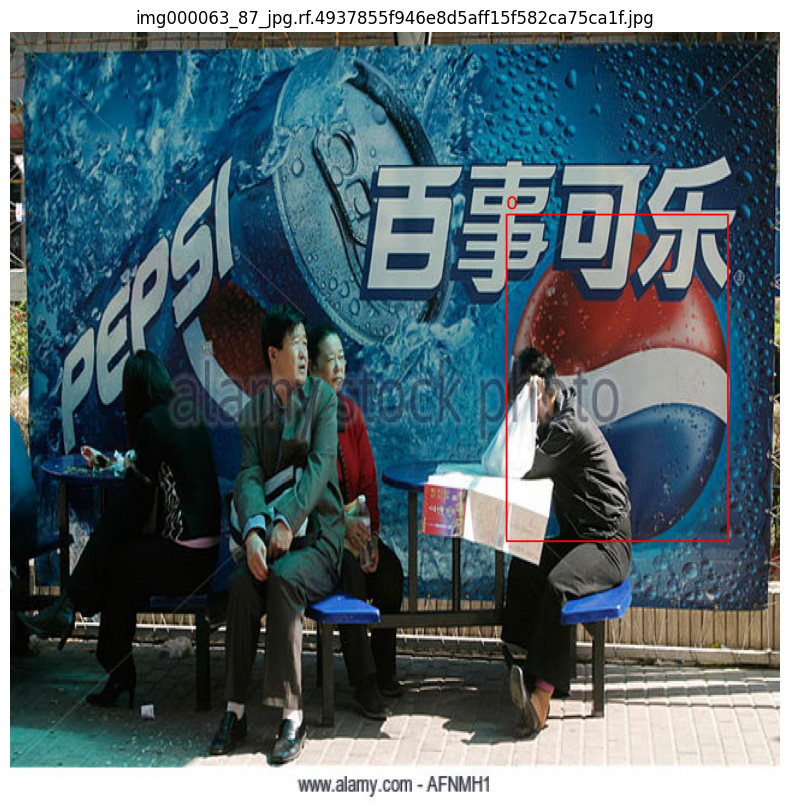

Loaded image img000076_87_jpg.rf.33984f36149d28136e50894e32c24d4f.jpg with shape: (1280, 1280, 3)


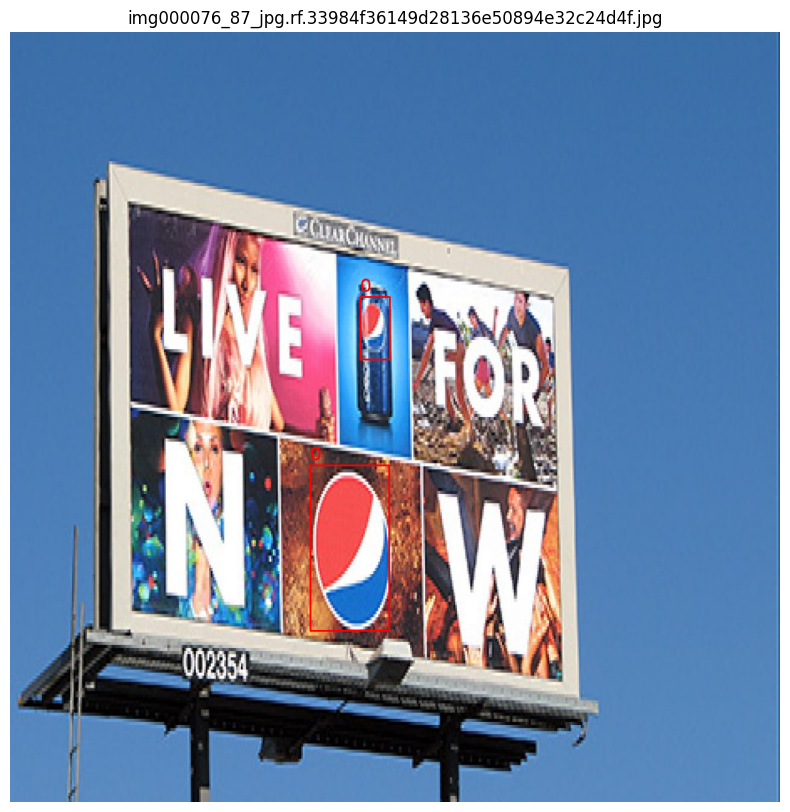

In [11]:
import os
import cv2
import matplotlib.pyplot as plt

image_path = os.path.join(dataset.location, "train/images")
label_path = os.path.join(dataset.location, "train/labels")

print(f"Image path: {image_path}")
print(f"Label path: {label_path}")

def load_and_display_images_with_bboxes(image_path, label_path, num_images=10):
    image_files = [f for f in os.listdir(image_path) if f.endswith('.jpg') or f.endswith('.png')]
    
    print(f"Found {len(image_files)} image files.")
    print(image_files[:num_images])
    
    for i, image_file in enumerate(image_files[:num_images]):
        img_path = os.path.join(image_path, image_file)
        label_file = os.path.splitext(image_file)[0] + ".txt"
        label_path_file = os.path.join(label_path, label_file)
        
        img = cv2.imread(img_path)
        
        if img is None:
            print(f"Failed to load image: {img_path}")
            continue
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        print(f"Loaded image {image_file} with shape: {img.shape}")
        
        if os.path.exists(label_path_file):
            with open(label_path_file, 'r') as f:
                for line in f.readlines():
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())
                    img_h, img_w, _ = img.shape
                    
                    x_center *= img_w
                    y_center *= img_h
                    width *= img_w
                    height *= img_h
                    x_min = int(x_center - width / 2)
                    y_min = int(y_center - height / 2)
                    x_max = int(x_center + width / 2)
                    y_max = int(y_center + height / 2)
                    
                    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
                    cv2.putText(img, "Pepsi"), (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
        
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.title(image_file)
        plt.axis('off')
        plt.show()

load_and_display_images_with_bboxes(image_path, label_path)

In [6]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.train(data="Pepsi-Logo-Detection-1\\data.yaml", epochs=5)

New https://pypi.org/project/ultralytics/8.2.58 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196  Python-3.12.2 torch-2.3.1+cpu CPU (13th Gen Intel Core(TM) i5-13500HX)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=Pepsi-Logo-Detection-1\data.yaml, epochs=5, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augme

In [5]:
from ultralytics import YOLO
import cv2

video_path = "test\\pepsi_test.mp4"
video_path_out = "test\\pepsi_out.mp4"

cap = cv2.VideoCapture(video_path)
ret, frame = cap.read()

if not ret:
    print("Error: Unable to read the video file.")
    cap.release()
    exit()

H, W, _ = frame.shape
out = cv2.VideoWriter(video_path_out, cv2.VideoWriter_fourcc(*'mp4v'), int(cap.get(cv2.CAP_PROP_FPS)), (W, H))

model = YOLO("test\\pepsi_best.pt")

threshold = 0.50

while ret:
    results = model(frame)

    for result in results[0].boxes:
        x1, y1, x2, y2 = result.xyxy[0]
        score = result.conf[0]
        class_id = result.cls[0]

        if score > threshold:
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            cv2.putText(frame, model.names[int(class_id)].upper(), (int(x1), int(y1 - 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2, cv2.LINE_AA)

    cv2.imshow("Output", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    
    out.write(frame)
    ret, frame = cap.read()

cap.release()
out.release()
cv2.destroyAllWindows()



0: 384x640 1 pepsi, 102.0ms
Speed: 2.0ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 50.0ms
Speed: 2.0ms preprocess, 50.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 50.0ms
Speed: 1.0ms preprocess, 50.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 37.0ms
Speed: 2.0ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 37.0ms
Speed: 2.0ms preprocess, 37.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 36.0ms
Speed: 1.0ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 35.0ms
Speed: 2.0ms preprocess, 35.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 pepsi, 36.0ms
Speed: 2.0ms preprocess, 36.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640